# <font color=purple> Machine Learning

<font color=purple> **The objective of this project is twofold: to delve into the study of machine learning libraries while advancing further in the exploration of Jupyter Notebook and Python. The project encompasses a many dataset and offers a range of exercises involving those datasets.** <font>

Several practices will be employed in this study:

1- Below certain commands, there will be a summary of their meanings.

2- All text will be written in English.

3- The data has been extracted from exercises on the Alura platform.

# About


In this course, we embark on an exciting journey delving into the intricacies of music recommendation leveraging Spotify's vast library and the versatile capabilities of the Sklearn library. Through a series of comprehensive modules, participants will gain valuable insights into the underlying principles and methodologies of music recommendation systems. From data preprocessing to model training and evaluation, each step will be meticulously explored, providing learners with a holistic understanding of the process.

Our exploration begins by understanding the fundamentals of music data representation and feature extraction. We delve into the rich metadata provided by Spotify, encompassing various attributes which serve as crucial inputs for our recommendation algorithms. Through hands-on exercises and real-world examples, the ideia is to learn how to effectively preprocess and transform raw music data into actionable insights, laying the groundwork for robust recommendation models.

In [1]:
# !pip install spotipy

# Imports

import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from skimage import io
from PIL import Image
from io import BytesIO
import requests

# Spotipy imports

import spotipy
from spotipy.oauth2 import SpotifyOAuth
from spotipy.oauth2 import SpotifyClientCredentials

# SKlearn imports

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics.pairwise import euclidean_distances

# Datasets

data_1 = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/Dados_totais.csv')
data_genres = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/data_by_genres.csv')
data_years = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/data_by_year.csv')

In [2]:
# Checking data_1

data_1.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady


In [3]:
# Checking data_genres

data_genres.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [4]:
# CHecking data_years

data_years.head()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5


In [5]:
# Removing unnecessary columns for this project

data_1 = data_1.drop(columns=['explicit','key','mode'], axis=1)
data_1.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady


In [6]:
# Checking null values

print(data_1.isna().sum(),data_1.isnull().sum() )

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64 valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64


In [7]:
# Removing unncessary columns from data_genres

data_genres = data_genres.drop(columns=['key','mode'], axis=1)
data_genres.head()

,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071


In [8]:
# Checking null values on data_genres

print(data_genres.isna().sum(),data_genres.isnull().sum() )

genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64 genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64


In [9]:
# Checking unique values from data_years vs data_1

print(data_years['year'].unique(), data_1['year'].unique())

[1921 1922 1923 1924 1925 1926 1927 1928 1929 1930 1931 1932 1933 1934
 1935 1936 1937 1938 1939 1940 1941 1942 1943 1944 1945 1946 1947 1948
 1949 1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962
 1963 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976
 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990
 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020] [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020]


In [10]:
# Changing data_years to start from 2000

data_years = data_years[data_years['year'] >= 2000]
data_years['year'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
      dtype=int64)

In [11]:
# Removing unncessary columns from data_years

data_years = data_years.drop(columns=['key','mode'], axis=1)
data_years.head()

,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
79,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049
80,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125
81,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500
82,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407
83,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143


In [12]:
# Reseting index from data_years

data_years = data_years.reset_index()
data_years.head()

,index,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,79,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049
1,80,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125
2,81,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500
3,82,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407
4,83,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143


In [13]:
# Checking null values from data_years

print(data_years.isna().sum(),data_years.isnull().sum() )

index               0
year                0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64 index               0
year                0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64


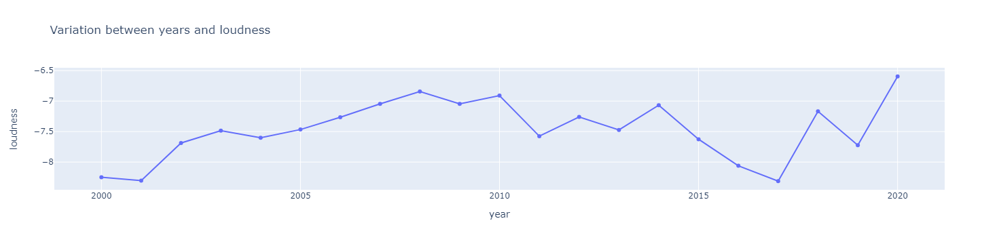

In [14]:
# Creating graphic

fig = px.line(data_years, x='year', y='loudness', markers=True, title='Variation between years and loudness')
fig.show()

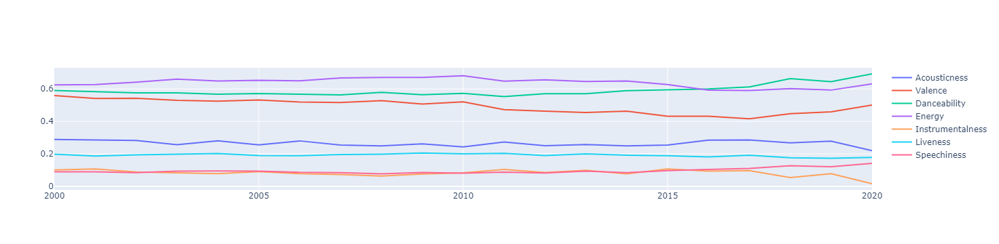

In [15]:
# Creating graphic using GO

fig = go.Figure()

fig.add_trace(go.Scatter(x=data_years['year'], y=data_years['acousticness'],
                    name='Acousticness'))
fig.add_trace(go.Scatter(x=data_years['year'], y=data_years['valence'],
                    name='Valence'))
fig.add_trace(go.Scatter(x=data_years['year'], y=data_years['danceability'],
                    name='Danceability'))
fig.add_trace(go.Scatter(x=data_years['year'], y=data_years['energy'],
                    name='Energy'))
fig.add_trace(go.Scatter(x=data_years['year'], y=data_years['instrumentalness'],
                    name='Instrumentalness'))
fig.add_trace(go.Scatter(x=data_years['year'], y=data_years['liveness'],
                    name='Liveness'))
fig.add_trace(go.Scatter(x=data_years['year'], y=data_years['speechiness'],
                    name='Speechiness'))
fig.show()

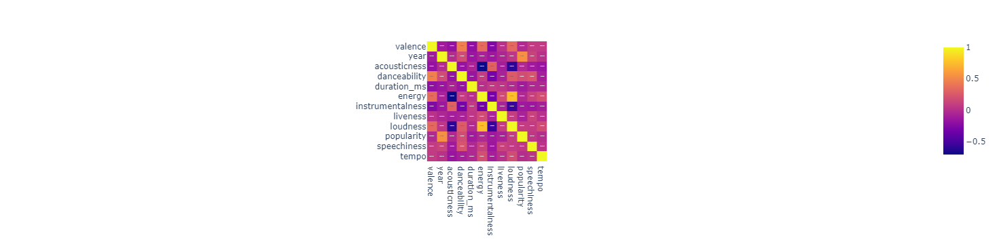

In [16]:
# Checking correlation matrix

numeric_data_1 = data_1.select_dtypes(include='number')

fig = px.imshow(numeric_data_1.corr(), text_auto = True)
fig.show()

In [17]:
# Changing data_genres, removing the name of the genres to apply ML models

data_genres_v2 = data_genres.drop(columns='genres', axis=1)
data_genres_v2

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071
...,...,...,...,...,...,...,...,...,...,...,...
2968,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943
2969,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000
2970,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667
2971,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000


In [18]:
# Applying pipeline

SEED = 1224
np.random.seed(1224)

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2, random_state=SEED))])

In [19]:
# Training pipeline

genre_embedding_pca = pca_pipeline.fit_transform(data_genres_v2)
projection = pd.DataFrame(columns=['x','y'], data=genre_embedding_pca)
projection

,x,y
0,5.910268,-0.011146
1,2.787093,4.498483
2,-0.757538,-1.258495
3,1.020521,-0.931690
4,0.753911,-0.999861
...,...,...
2968,-0.475136,-0.017126
2969,-3.026756,-1.304983
2970,-0.832511,-1.089726
2971,1.774790,-3.695233


In [20]:
# Creating kmeans

kmeans_pca = KMeans(n_clusters=5, verbose=False, random_state=SEED, n_init=10)
kmeans_pca.fit(projection)

data_genres['cluster_pca'] = kmeans_pca.predict(projection)
projection['cluster_pca'] = kmeans_pca.predict(projection)

In [21]:
# Creating new column to save genres on projection

projection['genres'] = data_genres['genres']
projection

,x,y,cluster_pca,genres
0,5.910268,-0.011146,2,21st century classical
1,2.787093,4.498483,2,432hz
2,-0.757538,-1.258495,3,8-bit
3,1.020521,-0.931690,0,[]
4,0.753911,-0.999861,0,a cappella
...,...,...,...,...
2968,-0.475136,-0.017126,4,zolo
2969,-3.026756,-1.304983,3,zouglou
2970,-0.832511,-1.089726,3,zouk
2971,1.774790,-3.695233,0,zurich indie


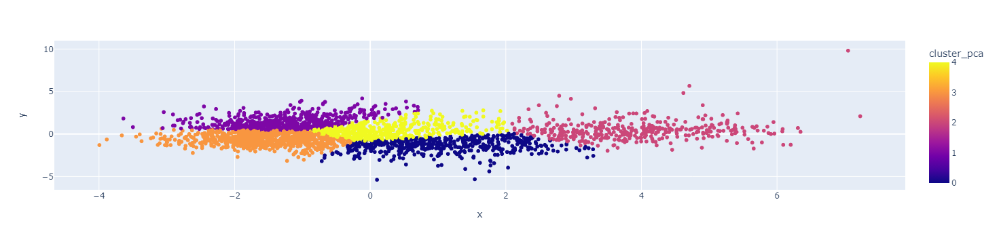

In [22]:
# Plotting

fig = px.scatter(projection, x='x', y='y', color='cluster_pca', hover_data=['x','y','genres'])
fig.show()

In [23]:
# Checking how much explanation inside pca

pca_pipeline[1].explained_variance_ratio_.sum()

0.49270669947266443

In [24]:
# How many columns are being explained by our two columns

pca_pipeline[1].explained_variance_.sum()

5.421597305805701

--------------------------------------------------------------------

In [25]:
# Creating one hot encoder

ohe = OneHotEncoder(dtype=int)
columns_ohe = ohe.fit_transform(data_1[['artists']]).toarray()

data_2 = data_1.drop(columns='artists', axis=1)

# Creating dummy

dummy_music = pd.concat([data_2, pd.DataFrame(columns_ohe, columns=ohe.get_feature_names_out(['artists']))], axis=1)
dummy_music

,valence,year,acousticness,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
0,0.285,2000,0.00239,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,...,0,0,0,0,0,0,0,0,0,0
1,0.613,2000,0.14300,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,...,0,0,0,0,0,0,0,0,0,0
2,0.400,2000,0.00958,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,...,0,0,0,0,0,0,0,0,0,0
3,0.543,2000,0.00664,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,...,0,0,0,0,0,0,0,0,0,0
4,0.760,2000,0.03020,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,0.187,2020,0.57400,0.445,176250,0.330,0PUkanqCGTb6qseXPKOw1F,0.000000,0.1020,-8.121,...,0,0,0,0,0,0,0,0,0,0
20307,0.240,2020,0.81500,0.467,179188,0.429,6Iw6fQVKZi0fWtEQBrTFcP,0.000052,0.1770,-8.689,...,0,0,0,0,0,0,0,0,0,0
20308,0.466,2020,0.31000,0.562,253613,0.686,308prODCCD0O660tIktbUi,0.022500,0.1250,-8.480,...,0,0,0,0,0,0,0,0,0,0
20309,0.522,2020,0.20400,0.598,230600,0.472,2f8y4CuG57UJEmkG3ujd0D,0.000015,0.1080,-10.991,...,0,0,0,0,0,0,0,0,0,0


In [26]:
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=0.7, random_state=SEED))])


music_embedding_pca = pca_pipeline.fit_transform(dummy_music.drop(['id','name','artists_song'], axis=1))
projection_m = pd.DataFrame(data=music_embedding_pca)

pca_pipeline[1].n_components_

612

In [27]:
# Applying kmeans

kmeans_pca_pipeline = KMeans(n_clusters=50, verbose=False, random_state=SEED, n_init=10)

kmeans_pca_pipeline.fit(projection_m)

data_1['cluster_pca'] = kmeans_pca_pipeline.predict(projection_m)
projection_m['cluster_pca'] = kmeans_pca_pipeline.predict(projection_m)

# Creating columns

projection_m['artist'] = data_1['artists']
projection_m['song'] = data_1['artists_song']
projection_m

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,cluster_pca,artist,song
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,-0.009111,0.005154,-0.034027,-0.032617,-8.253640e-14,5.136620e-13,7.657608e-13,0,Coldplay,Coldplay - Yellow
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,-0.031986,0.029708,-0.016322,-0.030234,-7.491724e-13,-2.010686e-12,-1.677522e-12,0,OutKast,OutKast - Ms. Jackson
2,-0.972077,0.658094,0.757500,-0.277350,-0.400393,0.402941,1.292960,1.839192,-1.562236,1.410677,...,0.017097,0.017361,-0.010979,-0.012781,-3.920158e-13,3.656480e-12,4.879501e-13,0,Linkin Park,Linkin Park - In the End
3,-0.926464,1.292091,0.398499,-0.997738,0.202219,0.620859,-0.527689,1.135529,-1.343893,1.020964,...,0.089337,0.164777,-0.064148,-0.040911,7.239742e-12,1.631238e-11,5.518117e-12,0,3 Doors Down,3 Doors Down - Kryptonite
4,-1.710077,-0.383502,-1.258562,1.346428,1.223591,1.744579,0.094311,0.479412,-2.125376,0.389565,...,-0.011937,-0.004081,-0.017478,-0.010033,-2.995219e-13,3.746248e-13,-4.669296e-13,31,Eminem,Eminem - The Real Slim Shady
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,1.346699,-2.775889,0.986755,-1.704967,0.103935,-0.726582,0.253808,0.520234,-0.064513,0.204971,...,-0.235355,-0.054256,0.016922,-0.125947,4.702909e-12,2.671493e-11,3.698388e-12,25,Bazzi,Bazzi - I Don't Think I'm Okay
20307,1.269387,-2.444619,0.971408,-0.115303,-0.719597,-1.823579,-0.545186,-1.475719,-0.338390,0.272129,...,-0.183026,0.074605,0.005622,0.000054,-1.052459e-11,-1.353793e-11,-3.034904e-12,25,Bryson Tiller,Bryson Tiller - Timeless Interlude
20308,0.781916,-1.164865,0.705256,-0.947160,1.145828,-0.472667,-0.356604,0.972512,0.900317,-0.674016,...,-0.033420,-0.157564,0.213849,-0.065180,3.705658e-12,-1.480913e-11,2.129680e-11,25,Fleet Foxes,Fleet Foxes - Sunblind
20309,0.002454,-3.056407,-0.272934,1.436355,-0.604453,0.251492,-1.361710,-0.633245,0.280076,0.521145,...,-0.784640,0.080684,0.038379,0.108493,1.311666e-11,1.959565e-11,-8.059134e-12,11,Gunna,Gunna - NASTY GIRL / ON CAMERA


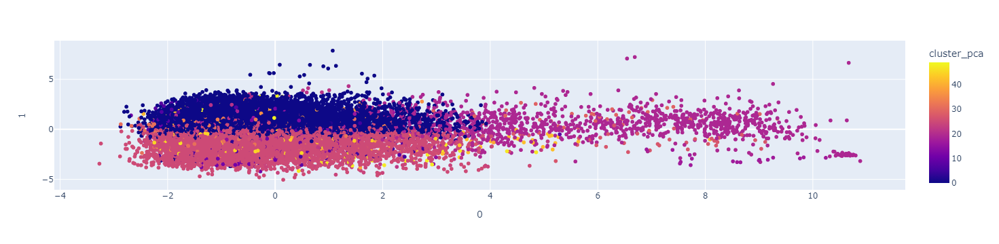

In [28]:
# Plotting projection_m

fig = px.scatter(projection_m, x=0, y=1, color='cluster_pca', hover_data=[0,1,'song'])
fig.show()

In [29]:
# Checking how much explanation inside pca

pca_pipeline[1].explained_variance_ratio_.sum()

0.7000008463187031

In [30]:
# How many columns are being explained by our two columns

pca_pipeline[1].explained_variance_.sum()

620.9313218688688

In [31]:
# Music Recommendation

music_name = 'Ed Sheeran - Shape of You'

cluster = list(projection_m[projection_m['song'] == music_name]['cluster_pca'])[0]

recommended_song = projection_m[projection_m['cluster_pca'] == cluster][[0,1,'song']]
x_music = list(projection_m[projection_m['song'] == music_name][0])[0]
y_music = list(projection_m[projection_m['song'] == music_name][1])[0]

distances = euclidean_distances(recommended_song[[0,1]], [[x_music, y_music]])
recommended_song['id'] = data_1['id']
recommended_song['distances'] = distances

selected = recommended_song.sort_values('distances').head(10)
selected

,0,1,song,id,distances
2463,-0.826954,-2.939691,Ed Sheeran - Shape of You,7qiZfU4dY1lWllzX7mPBI3,0.000000
2826,-0.831891,-2.941406,Juice WRLD - Hear Me Calling,13ZyrkCDmRz5xY3seuAWYk,0.005226
13421,-0.826575,-2.915302,$uicideBoy$ - For the Last Time,240audWazVjwvwh7XwfSZE,0.024393
2942,-0.863727,-2.965997,Marshmello - Be Kind (with Halsey),3Z8FwOEN59mRMxDCtb8N0A,0.045213
17093,-0.792448,-2.974369,Joyner Lucas - Will - Remix,6WI33r2QRxyxttn3KH0XkC,0.048920
5371,-0.874338,-2.927113,The Kid LAROI - WRONG (feat. Lil Mosey),1EWkw4Fa6IlnsAihLUlFFM,0.049025
13682,-0.878031,-2.944654,YoungBoy Never Broke Again - House Arrest Tingz,4Boj4bBiDv6Ur1zKEvLXBI,0.051317
15392,-0.792012,-2.987829,$uicideBoy$ - Putrid Pride,4CwA4CdTQqNv18QSAW3Srk,0.059483
15388,-0.784530,-2.897926,Pop Smoke - Paranoia (feat. Gunna & Young Thug),3QqJ44HiM84iyZS0G2IKIP,0.059533
5271,-0.789801,-2.986457,Ed Sheeran - South of the Border (feat. Camila...,4vUmTMuQqjdnvlZmAH61Qk,0.059728


In [32]:
# Using spotipy

scope = 'user-library-read playlist-modify-private'
OAuth = SpotifyOAuth(
    scope = scope,
    redirect_uri='http://localhost:8888/callback',
    client_id = '5d46d8b0609d4b7ba79722b42cfcd5f9',
    client_secret='ec85aefb9d5e429fa0293918efc0de3b'
)

client_credentials_manager = SpotifyClientCredentials(client_id='5d46d8b0609d4b7ba79722b42cfcd5f9',client_secret='ec85aefb9d5e429fa0293918efc0de3b')
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

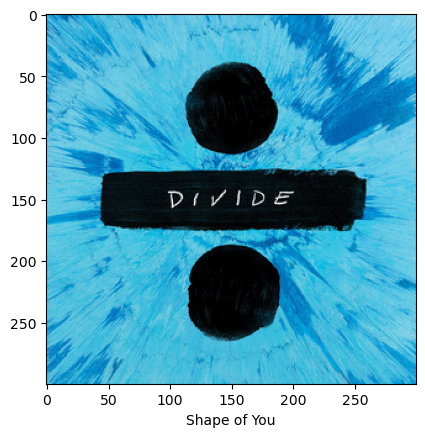

In [33]:
# Testing the API

id = data_1[data_1.artists_song == music_name]['id'].iloc[0]
track = sp.track(id)
url = track['album']['images'][1]['url']
name = track['name']


image = io.imread(url)


plt.imshow(image)
plt.xlabel(name, fontsize=10)
plt.show()

In [34]:
# Searching playlist

def recommended_id(playlist_id):
    url = []
    name = []
    
    for i in playlist_id:
        track = sp.track(i)
        url.append(track['album']['images'][1]['url'])
        name.append(track['name'])
        
    return name, url

name, url = recommended_id(selected['id'])
name, url

(['Shape of You',
  'Hear Me Calling',
  'For the Last Time',
  'Be Kind (with Halsey)',
  'Will - Remix',
  'WRONG (feat. Lil Mosey)',
  'House Arrest Tingz',
  'Putrid Pride',
  'Paranoia (feat. Gunna & Young Thug)',
  'South of the Border (feat. Camila Cabello & Cardi B)'],
 ['https://i.scdn.co/image/ab67616d00001e02ba5db46f4b838ef6027e6f96',
  'https://i.scdn.co/image/ab67616d00001e02af149eb4002f65f83afc63c4',
  'https://i.scdn.co/image/ab67616d00001e02f795a2962820664b4112901e',
  'https://i.scdn.co/image/ab67616d00001e02fdf2e993e10e67396b3bf759',
  'https://i.scdn.co/image/ab67616d00001e024ac196312c24faedb76a345e',
  'https://i.scdn.co/image/ab67616d00001e02891f0552bed344dc2bfe322f',
  'https://i.scdn.co/image/ab67616d00001e028bd6e34012a7ab6311050d0c',
  'https://i.scdn.co/image/ab67616d00001e0207aa1426cb2b3cfd8ad67c64',
  'https://i.scdn.co/image/ab67616d00001e0246e1307c35579c3483ea7b03',
  'https://i.scdn.co/image/ab67616d00001e0273304ce0653c7758dd94b259'])

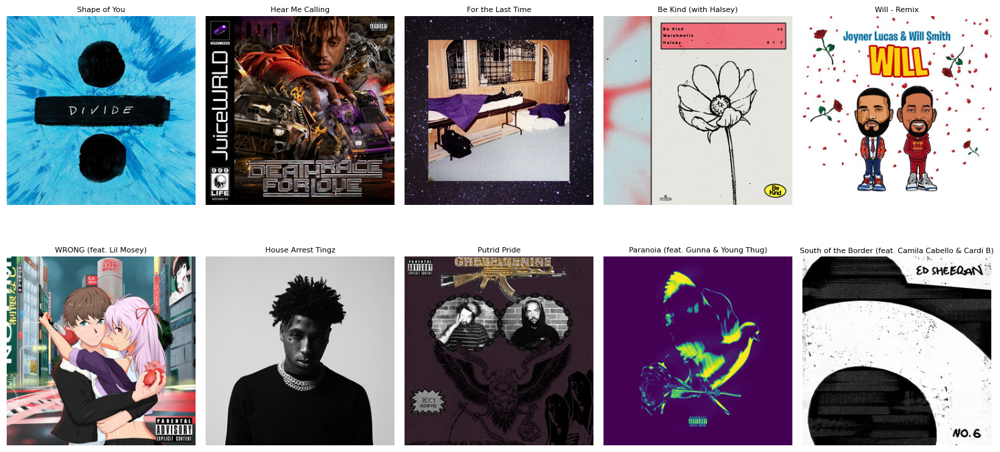

In [35]:
# Plotting images/ names from recommended songs

def visualized_song(name, url):
    plt.figure(figsize=(15, 8)) 
    columns = 5
    rows = (len(url) + columns - 1) // columns 

    for i, u in enumerate(url):
        response = requests.get(u)
        image = Image.open(BytesIO(response.content))
        
        ax = plt.subplot(rows, columns, i + 1)
        ax.imshow(image)
        ax.axis('off')
        
        ax.set_title(name[i], fontsize=8, pad=4)
        
    plt.tight_layout()
    plt.show()

visualized_song(name, url)

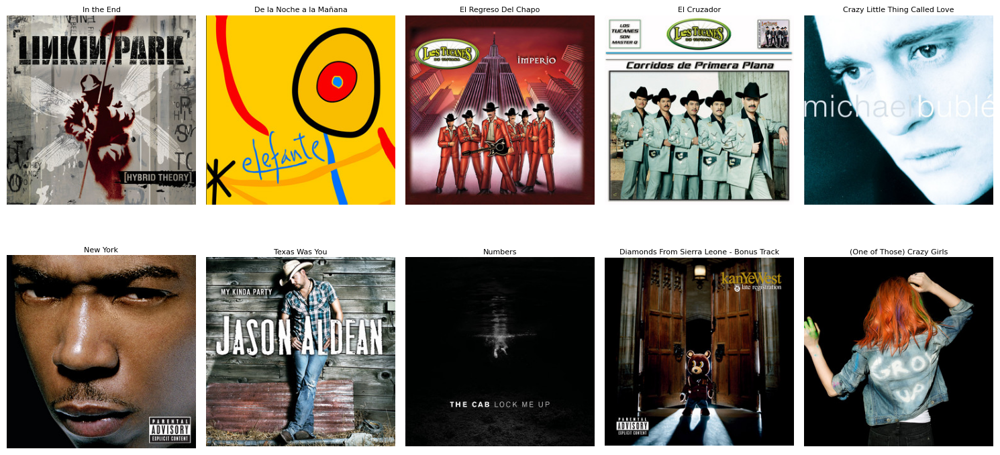

In [36]:
# Placing all function in one single function

def songs_choice(song_name):
    
    cluster = list(projection_m[projection_m['song'] == song_name]['cluster_pca'])[0]
    recommended_song = projection_m[projection_m['cluster_pca'] == cluster][[0,1,'song']]
    x_music = list(projection_m[projection_m['song']== song_name][0])[0]
    y_music = list(projection_m[projection_m['song']== song_name][1])[0]
    distances = euclidean_distances(recommended_song[[0, 1]], [[x_music, y_music]])
    recommended_song['id'] = data_1['id']
    recommended_song['distances'] = distances
    selected = recommended_song.sort_values('distances').head(10)

  # ## Accessing music infos via spotpy

    playlist_id = selected['id']

    url = []
    name = []
    for i in playlist_id:
        track = sp.track(i)
        url.append(track["album"]["images"][1]["url"])
        name.append(track["name"])
        
    plt.figure(figsize=(15, 8)) 
    columns = 5
    rows = (len(url) + columns - 1) // columns 

    for i, u in enumerate(url):
        response = requests.get(u)
        image = Image.open(BytesIO(response.content))
        
        ax = plt.subplot(rows, columns, i + 1)
        ax.imshow(image)
        ax.axis('off')
        
        ax.set_title(name[i], fontsize=8, pad=4)
        
    plt.tight_layout()
    plt.show()
    
songs_choice('Linkin Park - In the End')